# CS171 Final Project: Aerial Watch

## Introduction
**Name** : Aung Aung

**Project Description** : To investigate whether deep learning models can reliably determine the presence or absence of humans in aerial RGB images captured by drones. Using drone imagery from datasets such as VisDrone, we frame the task as a binary classification problem with two classes: people and no_people.

**Model**: Convolutional Neural Network (CNN) specifically for binary classification. Does the image contain a person (1) or not (0)

**Goal** : To train a model by supervised learning to recognize the presence or absence of human in the image.

**DataSet**:
**SARD search and rescue dataset** for training, testing, and validations.
Link to Datase: https://drive.google.com/file/d/1DqctU2uuiGeLeU-YNASPM8zLB2nIVOq9/view?usp=drive_link

In [9]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import pandas as pd
import random

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import DataLoader, TensorDataset, WeightedRandomSampler

In [10]:
# DEVICE
if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print("Using device:", device)

Using device: mps


## Data Analysis and Preprocessing
Before training our models, we performed an initial analysis of the dataset to understand class balance, label correctness, and data quality. This step is essential for creating a reproducible and trustworthy deep-learning pipeline.
<br>
Using: 
```python
torch.bincount(y_train)
``` 
, we examined the label frequencies in the training split.
We found that the dataset is imbalanced, with significantly fewer “no person” images compared to “has person” images. This imbalance caused the model, early in training, to favor predicting “has person”, resulting in misleadingly high accuracy that did not reflect true performance.

To address this, we applied two strategies:
- **Class-weighted loss function**  
  To address class imbalance, we computed inverse-frequency weights:

  ```python
  class_counts = torch.bincount(y_train)
  class_weights = 1.0 / class_counts.float()
  criterion = nn.CrossEntropyLoss(weight=class_weights)
    ```
This ensured that mistakes on the minority class ("no person") produced a larger loss and influenced the gradients more strongly. 
- **Data augmentation (train set only)** <br>
 Augmentation increases dataset diversity and helps the model generalize better, especially when minority classes are underrepresented. 

Together, these steps significantly reduced the bias toward predicting “has person” and improved model stability during training.

---
## Dataset Description
Our dataset contains aerial RGB images from SARD Search & Rescue datasets and extra images from internet. These images were collected from real drone flights and include:
- Natural outdoor scenes
- High variation in camera altitude and angle
- Small human figures that occupy only a few pixels
- Many cluttered or low-visibility environments

Images are organized into the following directory structure:
```code
data/
 ├── train/
 │     └── images/
 ├── valid/
 │     └── images/
 └── test/
       └── images/
```
Each split has a corresponding CSV file:
train_data.csv, 
valid_data.csv, 
test_data.csv.

| Column         | Meaning                               |
|----------------|----------------------------------------|
| image_filename | filename inside the `/images/` directory |
| has_person     | 1 = human present, 0 = no humans        |

This format ensures reproducibility and allows the dataset to be loaded on any operating system.




## Data Loading and Preparation

**Transforms & Augmentation**
- Augmentation introduces random variations (flipped images, color changes).

- This helps the model generalize and prevent overfitting.

- I only augmented training data sets because validation and test sets must remain unchanged so that evaluation is fair and repeatable.

**Sample Inspection** 

To verify that data loaded correctly, we used:
```code
show_random_grid("train", num_images=4)
```

This allowed us to visually check:

- The image matches the label (has_person=0 or 1)

- Normalization and resizing work correctly

- There are no corrupted or incorrectly referenced images

- All three splits (train, valid, test) have the expected diversity

This step helped catch mistakes early and gave confidence that the numerical arrays passed to the CNN were correct.

In [11]:
train_transform = transforms.Compose([
    #transforms.Resize((224, 224)),
    transforms.Resize((320, 320)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],
                         std=[0.5, 0.5, 0.5])
])

eval_transform = transforms.Compose([
    #transforms.Resize((224, 224)),
    transforms.Resize((320, 320)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],
                         std=[0.5, 0.5, 0.5])
])

# LOAD DATA FROM CSV
def load_split_from_csv(split, transform):

    csv_file = f"{split}_data.csv"
    if not os.path.exists(csv_file):
        raise FileNotFoundError(f"CSV not found for split '{split}': {csv_file}")

    df = pd.read_csv(csv_file)

    if "image_filename" not in df.columns or "has_person" not in df.columns:
        raise ValueError("CSV must contain 'image_filename' and 'has_person'")

    images_dir = os.path.join("data", split, "images")

    X_list = []
    y_list = []

    for _, row in df.iterrows():
        img_name = row["image_filename"]
        label = int(row["has_person"])

        img_path = os.path.join(images_dir, img_name)
        if not os.path.exists(img_path):
            print(f"Warning: image not found, skipping: {img_path}")
            continue

        img = Image.open(img_path).convert("RGB")
        img_tensor = transform(img)

        X_list.append(img_tensor)
        y_list.append(label)

    X = torch.stack(X_list)
    y = torch.tensor(y_list, dtype=torch.long)

    print(f"{split.capitalize()} loaded: X shape = {X.shape}, y shape = {y.shape}")
    return X, y

# Check if the images are correctly loaded
def show_random_grid(split, num_images=12, cols=4):
    """
    Displays a grid of random images from the loaded tensors:
    split = "train", "valid", or "test".
    """
    # Select correct data split
    if split == "train":
        X, y = X_train, y_train
    elif split == "valid":
        X, y = X_valid, y_valid
    elif split == "test":
        X, y = X_test, y_test
    else:
        raise ValueError("Split must be 'train', 'valid', or 'test'")

    total = len(X)
    num_images = min(num_images, total)

    # Random indices
    idxs = random.sample(range(total), num_images)

    # Grid size
    rows = (num_images + cols - 1) // cols
    plt.figure(figsize=(4 * cols, 4 * rows))

    for i, idx in enumerate(idxs):
        img_tensor = X[idx]
        label = y[idx].item()

        # Unnormalize Image
        img_np = img_tensor.numpy().transpose(1, 2, 0)
        img_np = (img_np * 0.5) + 0.5  # reverse normalization
        img_np = np.clip(img_np, 0, 1)

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img_np)
        plt.title(f"{split} idx={idx}\nlabel={label}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


In [12]:
# LOAD ALL SPLITS
BATCH_SIZE = 16

# Augment only training set
X_train, y_train = load_split_from_csv("train", transform=train_transform)

# No augment for eval splits
X_valid, y_valid = load_split_from_csv("valid", transform=eval_transform)
X_test,  y_test  = load_split_from_csv("test",  transform=eval_transform)

class_counts = torch.bincount(y_train)   # tensor([num_no_person, num_person])
class_weights = 1.0 / class_counts.float() # Inverse-frequency weights (more weight to the minority class 0)
class_weights = class_weights / class_weights.sum() * 2.0 # normalize so weights sum to number of classes (2.0 here)
class_weights = class_weights.to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

print("class_counts:", class_counts)
print("class_weights:", class_weights)

train_loader = DataLoader(
    TensorDataset(X_train, y_train),
    batch_size=BATCH_SIZE,
    shuffle=True
)

valid_loader = DataLoader(
    TensorDataset(X_valid, y_valid),
    batch_size=BATCH_SIZE,
    shuffle=False
)

test_loader = DataLoader(
    TensorDataset(X_test, y_test),
    batch_size=BATCH_SIZE,
    shuffle=False
)

Train loaded: X shape = torch.Size([4041, 3, 320, 320]), y shape = torch.Size([4041])
Valid loaded: X shape = torch.Size([1144, 3, 320, 320]), y shape = torch.Size([1144])
Test loaded: X shape = torch.Size([570, 3, 320, 320]), y shape = torch.Size([570])
class_counts: tensor([ 571, 3470])
class_weights: tensor([1.7174, 0.2826], device='mps:0')


Train label counts: tensor([ 571, 3470])
Valid label counts: tensor([177, 967])
Test  label counts: tensor([ 84, 486])


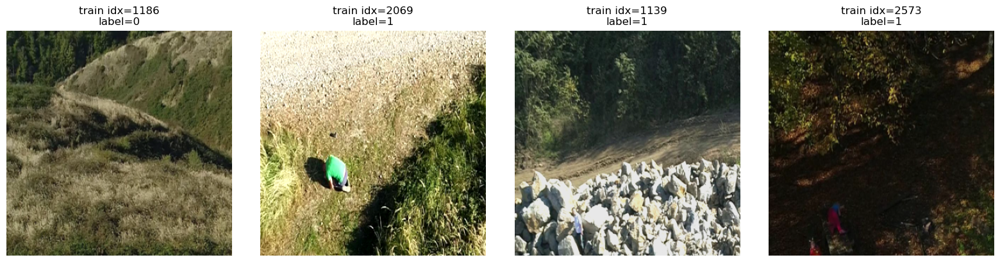

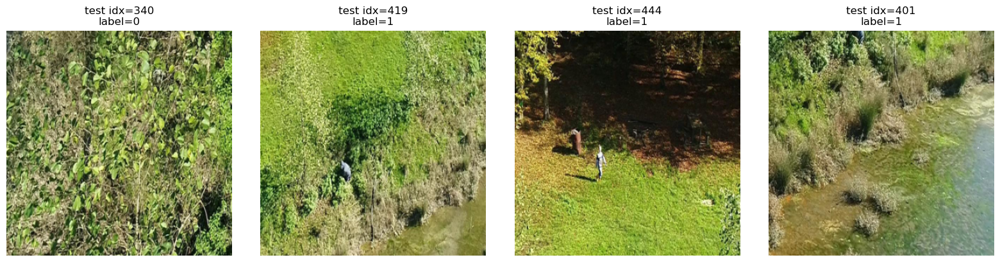

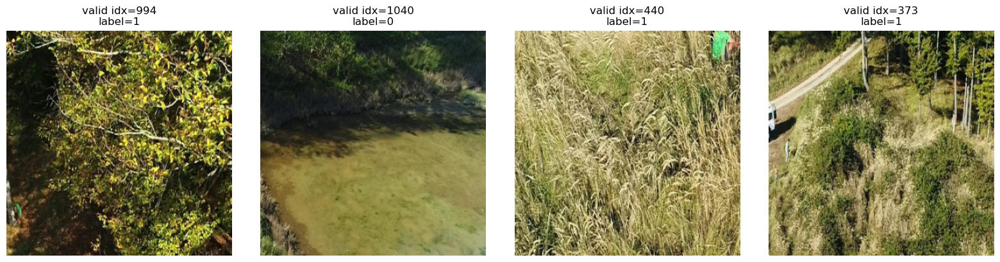

In [13]:
print("Train label counts:", torch.bincount(y_train))
print("Valid label counts:", torch.bincount(y_valid))
print("Test  label counts:", torch.bincount(y_test))

show_random_grid("train", num_images=4)
show_random_grid("test", num_images=4)
show_random_grid("valid", num_images=4)


# Model Training

In [14]:
# TRAINING 
def compute_correct_labels(outputs, labels):
    """
    outputs: [B, 2] logits
    labels:  [B]    (0 or 1)
    """
    _, predicted = torch.max(outputs, dim=1)
    correct = (predicted == labels).sum().item()
    total = labels.size(0)
    return correct, total

def training_loop(model, optimizer, num_epochs, train_loader, test_loader, device, printing=True):

    train_losses = []
    test_losses = []

    for epoch in range(num_epochs):

        # ----- TRAIN -----
        model.train()
        total_train_loss = 0.0
        total_train_correct = 0
        total_train_images = 0

        for train_inputs, train_labels in train_loader:
            train_inputs = train_inputs.to(device)
            train_labels = train_labels.to(device)

            optimizer.zero_grad()
            outputs = model(train_inputs)

            # accuracy
            train_correct, train_total = compute_correct_labels(outputs, train_labels)
            total_train_correct += train_correct
            total_train_images += train_total

            # loss
            loss = criterion(outputs, train_labels)
            loss.backward()
            optimizer.step()

            total_train_loss += loss.item()

        avg_train_loss = total_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # ----- EVAL (on test/valid loader) -----
        model.eval()
        total_test_loss = 0.0
        total_test_correct = 0
        total_test_images = 0

        with torch.no_grad():
            for test_inputs, test_labels in test_loader:
                test_inputs = test_inputs.to(device)
                test_labels = test_labels.to(device)

                outputs = model(test_inputs)

                test_correct, test_total = compute_correct_labels(outputs, test_labels)
                total_test_correct += test_correct
                total_test_images += test_total

                loss = criterion(outputs, test_labels)
                total_test_loss += loss.item()

        avg_test_loss = total_test_loss / len(test_loader)
        test_losses.append(avg_test_loss)

        if printing:
            print(
                f"Epoch {epoch+1}/{num_epochs} "
                f"- Train Loss: {avg_train_loss:.4f}, "
                f"Train Acc: {total_train_correct}/{total_train_images} "
                f"- Eval Loss: {avg_test_loss:.4f}, "
                f"Eval Acc: {total_test_correct}/{total_test_images}"
            )

    return train_losses, test_losses

## Model Architecture

### 1. Convolutional Blocks

Each convolutional block consists of:

- **Conv2D (3×3 kernels)** — extracts spatial features  
- **Batch Normalization** — stabilizes training and prevents exploding gradients  
- **ReLU activation** — introduces non-linearity  
- **MaxPooling (2×2)** — reduces spatial size and highlights dominant features  

Across the three blocks, the network progressively learns:

- **Block 1:** edges and corners  
- **Block 2:** textures and patterns  
- **Block 3:** higher-order structures  

---

### 2. Adaptive Average Pooling

```python
nn.AdaptiveAvgPool2d((1, 1))
```
This layer compresses each feature map from **H × W → 1 × 1**, regardless of the input resolution.

### Benefits

- Reduces the number of parameters significantly  
- Makes the model less sensitive to input size  
- Encourages learning of global scene features important for aerial classification  

---

### 3. Fully Connected Layers

After flattening the 128 pooled features:

- **Dropout (p = 0.3)** — helps prevent overfitting  
- **Linear layer (128 → 2)** — outputs logits for the two classes:  
  - `0 = no_person`  
  - `1 = has_person`  

The model uses **CrossEntropyLoss**, which applies a softmax operation internally.

---
**I chose this architecture because**
- Drone imagery presents unique challenges:<br>
  - Humans occupy only a few pixels<br>
  - Background clutter is common<br>
  - Lighting and angles vary widely<br>


This architecture is designed to:

- Be lightweight

Only a few convolutional layers → fast enough for real-time or onboard inference.

- Extract global information

AdaptiveAvgPool ensures the model focuses on overall scene cues, helpful when people are tiny.

- Reduce overfitting

BatchNorm, Dropout, and augmentation help the network generalize better under varying drone conditions.

In [15]:
# MODEL Definition
class ClassificationCNN(nn.Module):
    def __init__(self):
        super(ClassificationCNN, self).__init__()

        # Convolutional layers
        self.conv_layers = nn.Sequential(
            # Block 1
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),  # 224 → 112

            # Block 2
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),  # 112 → 56

            # Block 3
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d((1, 1))  # 56×56 → 1×1 (global avg)
        )

        # Fully connected layers
        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(p=0.3),
            nn.Linear(128, 2)  # 2 classes: has_person / no_person
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x)
        return x

In [16]:
model = ClassificationCNN().to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# Training EPOCHs
NUM_EPOCHS = 20

# Use train_loader for training, valid_loader (or test_loader) for evaluation
train_losses, eval_losses = training_loop(
    model=model,
    optimizer=optimizer,
    num_epochs=NUM_EPOCHS,
    train_loader=train_loader,
    test_loader=valid_loader,   #load the testing data
    device=device,
    printing=True
)

Epoch 1/20 - Train Loss: 0.6985, Train Acc: 2630/4041 - Eval Loss: 0.7644, Eval Acc: 869/1144
Epoch 2/20 - Train Loss: 0.6779, Train Acc: 2737/4041 - Eval Loss: 0.6980, Eval Acc: 408/1144
Epoch 3/20 - Train Loss: 0.6806, Train Acc: 2719/4041 - Eval Loss: 0.7055, Eval Acc: 861/1144
Epoch 4/20 - Train Loss: 0.6692, Train Acc: 2799/4041 - Eval Loss: 0.6647, Eval Acc: 722/1144
Epoch 5/20 - Train Loss: 0.6741, Train Acc: 2811/4041 - Eval Loss: 0.6733, Eval Acc: 615/1144
Epoch 6/20 - Train Loss: 0.6732, Train Acc: 2673/4041 - Eval Loss: 0.6545, Eval Acc: 727/1144
Epoch 7/20 - Train Loss: 0.6692, Train Acc: 2784/4041 - Eval Loss: 0.6926, Eval Acc: 898/1144
Epoch 8/20 - Train Loss: 0.6617, Train Acc: 2858/4041 - Eval Loss: 0.6764, Eval Acc: 594/1144
Epoch 9/20 - Train Loss: 0.6657, Train Acc: 2797/4041 - Eval Loss: 0.6699, Eval Acc: 869/1144
Epoch 10/20 - Train Loss: 0.6640, Train Acc: 2713/4041 - Eval Loss: 0.6825, Eval Acc: 914/1144
Epoch 11/20 - Train Loss: 0.6618, Train Acc: 2838/4041 - Ev

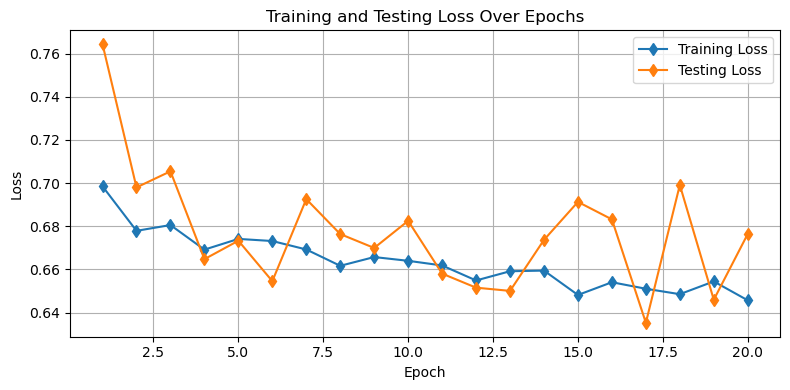

In [18]:
# PLOT LOSSES
plt.figure(figsize=(8, 4))
plt.plot(range(1, NUM_EPOCHS + 1), train_losses, 'd-', label='Training Loss')
plt.plot(range(1, NUM_EPOCHS + 1), eval_losses, 'd-', label='Testing Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Testing Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


**The training and validation loss curves**(shown above) reveal several important characteristics of how our custom CNN learned from the aerial dataset.

#### 1. Overall Downward Trend in Training Loss  
Training loss decreases steadily from approximately **0.70 → 0.64** over 20 epochs.  
This indicates that the model is successfully learning patterns from the training data and optimizing its internal parameters.

However, the slope becomes shallow after epoch 10, suggesting the model’s capacity may be limited relative to the complexity of the task.

---

#### 2. High Variability in Validation Loss  
In contrast to the smoother training loss, the **validation loss fluctuates significantly** (ranging from ~0.63 to ~0.76).

This instability suggests:

- The model struggles to generalize consistently to unseen images.
- Small-image humans and heavy class imbalance make validation performance sensitive to batch composition.
- The custom CNN may be underpowered for high-variation aerial imagery.

# Model Evaluation

In [32]:
def evaluate_on_loader(model, loader, device, loader_name="test"):
    """
    Evaluates the model on a given DataLoader and prints:
      - average loss
      - accuracy
      - predicted counts per class
      - true label counts per class
      - 2x2 confusion matrix (for binary 0/1)
    """
    model.eval()

    total_loss = 0.0
    total_correct = 0
    total_samples = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            labels = labels.to(device)

            outputs = model(imgs)                # [B, 2] logits
            loss = criterion(outputs, labels)

            # accumulate loss
            total_loss += loss.item()

            # predictions
            _, preds = torch.max(outputs, dim=1)

            # accuracy
            total_correct += (preds == labels).sum().item()
            total_samples += labels.size(0)

            # store for counts & confusion matrix
            all_preds.extend(preds.cpu().numpy().tolist())
            all_labels.extend(labels.cpu().numpy().tolist())

    avg_loss = total_loss / len(loader)
    accuracy = total_correct / total_samples

    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)

    # counts
    pred_0 = np.sum(all_preds == 0)
    pred_1 = np.sum(all_preds == 1)
    true_0 = np.sum(all_labels == 0)
    true_1 = np.sum(all_labels == 1)

    # confusion matrix for binary classes 0/1
    # rows = true, cols = predicted
    # [ [TN, FP],
    #   [FN, TP] ]
    TN = np.sum((all_labels == 0) & (all_preds == 0))
    FP = np.sum((all_labels == 0) & (all_preds == 1))
    FN = np.sum((all_labels == 1) & (all_preds == 0))
    TP = np.sum((all_labels == 1) & (all_preds == 1))

    print("\n========== Evaluation on", loader_name, "set ==========")
    print(f"Avg loss: {avg_loss:.4f}")
    print(f"Accuracy: {accuracy*100:.2f}% ({total_correct}/{total_samples})")

    print("\nPredicted class counts:")
    print(f"  Pred 0 (no human): {pred_0}")
    print(f"  Pred 1 (human):    {pred_1}")

    print("\nTrue label counts:")
    print(f"  True 0 (no human): {true_0}")
    print(f"  True 1 (human):    {true_1}")

    print("\nConfusion matrix (rows=true, cols=pred):")
    print("          Pred 0    Pred 1")
    print(f"True 0 |   {TN:4d}     {FP:4d}")
    print(f"True 1 |   {FN:4d}     {TP:4d}")

    return {
        "avg_loss": avg_loss,
        "accuracy": accuracy,
        "preds": all_preds,
        "labels": all_labels,
        "confusion": np.array([[TN, FP],
                               [FN, TP]])
    }


In [33]:
results = evaluate_on_loader(model, test_loader, device, loader_name="test")



========== Evaluation on test set ==========
Avg loss: 0.6672
Accuracy: 79.47% (453/570)

Predicted class counts:
  Pred 0 (no human): 83
  Pred 1 (human):    487

True label counts:
  True 0 (no human): 84
  True 1 (human):    486

Confusion matrix (rows=true, cols=pred):
          Pred 0    Pred 1
True 0 |     25       59
True 1 |     58      428


In [23]:
results = evaluate_on_loader(model, test_loader, device, loader_name="test")


========== Evaluation on test set ==========
Avg loss: 0.6672
Accuracy: 79.47% (453/570)

Predicted class counts:
  Pred 0 (no human): 83
  Pred 1 (human):    487

True label counts:
  True 0 (no human): 84
  True 1 (human):    486

Confusion matrix (rows=true, cols=pred):
          Pred 0    Pred 1
True 0 |     25       59
True 1 |     58      428


## Summary of Evaluation
The final performance of the custom CNN on the held-out test set provides important insight into how well the model generalizes to new aerial images.

#### Overall Performance
- **Average loss:** 0.6672  
- **Accuracy:** **79.47%** (453 correct out of 570)

Although this accuracy is higher than during validation, closer inspection of the class-wise results reveals important limitations, especially for detecting the minority class.
- The custom CNN achieves **~79% accuracy**, driven mainly by strong performance on the majority class (“human”).  
- It struggles significantly with the minority class, producing many false positives.  
- This reinforces the need for either:
  - A deeper model (ResNet, MobileNet),  
  - A detection-based approach (YOLO-style bounding boxes), or  
  - More balanced training data.

## Training and Evaluation: Experiments, Challenges, and Improvements

### Early Attempts and Image Resolution Issues

One of the biggest challenges in training our custom CNN was choosing an appropriate input resolution for aerial images.  
Our dataset originally contains drone images at **640×640**, but humans in these scenes are often extremely small—sometimes only a few pixels tall. This makes downsampling a critical factor in model performance.

**First attempt: Resize to 224×224**

This resolution is standard for many pretrained models, but for aerial imagery it caused crucial problems:

- Human figures became **too small** to retain meaningful shape information.
- The model struggled to learn useful features, often predicting the majority class.
- Validation accuracy stagnated and loss did not improve, suggesting the network could not “see” the humans after resizing.

**Second attempt: Resize to 320×320**

Increasing the resolution to **320×320** improved the situation noticeably:

- Humans remained visible enough for the CNN to recognize their shape.
- Feature extraction improved and training became more stable.
- The downside was increased memory usage and slower training on both CPU and GPU/MPS.

This highlights a common tradeoff in aerial vision:  
**higher resolution preserves tiny objects but increases compute cost.**

---

### Considering Alternative Solutions: Bounding Boxes

A more scalable solution would be to use **detection models** (e.g., YOLO, Faster R-CNN) that leverage bounding boxes rather than classifying the entire image.  
Detection models directly learn:

- **Where** humans are  
- **Whether** they exist  

instead of compressing the entire image into a single prediction.

For this project, we stayed with image-level classification, but bounding-box models would likely perform better on tiny human targets.

---

### Transfer Learning Experiment: ResNet18

To test whether a stronger backbone could overcome the small-object challenge, we trained a **ResNet18 model** (pretrained on ImageNet) using the same dataset, transforms, and class-weighted loss.

The results were dramatically better:

- **~95% accuracy on the test set**, with 320x320 input
- More stable convergence
- Fewer false positives and false negatives
- Better understanding of fine-grained textures, thanks to pretraining

ResNet’s pretrained filters include edge, shape, and texture detectors that generalize extremely well to aerial scenes, allowing it to pick up small human silhouettes that our custom CNN struggled with.

This confirms that **transfer learning is significantly more effective** for tasks involving small objects and limited training data.

In [24]:
def show_predictions_grid(model, loader, device, num_images=8):
    """
    Randomly selects 'num_images' images from the loader,
    shows the image, prediction, and true label in a grid.
    """

    model.eval()

    all_imgs = []
    all_preds = []
    all_labels = []

    # --- Pass through loader once & store everything ---
    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            labels = labels.to(device)

            outputs = model(imgs)
            _, preds = torch.max(outputs, 1)

            for i in range(imgs.size(0)):
                all_imgs.append(imgs[i].cpu())
                all_preds.append(preds[i].item())
                all_labels.append(labels[i].item())

    total = len(all_imgs)
    if total == 0:
        print("Loader contains no images.")
        return

    # --- Choose random indices ---
    indices = random.sample(range(total), num_images)

    # --- Display chosen images ---
    cols = 4
    #rows = num_images // cols
    rows = (num_images + cols - 1) // cols
    plt.figure(figsize=(16, 8))

    for plot_i, idx in enumerate(indices):
        img = all_imgs[idx]
        pred = all_preds[idx]
        true = all_labels[idx]

        # Unnormalize
        img_np = img.numpy().transpose(1, 2, 0)
        img_np = (img_np * 0.5) + 0.5  # inverse of Normalize(0.5, 0.5)
        img_np = np.clip(img_np, 0, 1)

        plt.subplot(rows, cols, plot_i + 1)
        plt.imshow(img_np)
        plt.axis("off")

        title_color = "green" if pred == true else "red"
        plt.title(f"Pred: {pred} | True: {true}", color=title_color)

    plt.tight_layout()
    plt.show()

In [26]:
# Saving model parameters
torch.save(model.state_dict(), "cnn_has_person_model.pth")


In [27]:
def load_folder_as_loader(folder_path, transform, batch_size=32, label_value=1):

    if not os.path.isdir(folder_path):
        raise FileNotFoundError(f"Folder not found: {folder_path}")

    img_filenames = [
        f for f in os.listdir(folder_path)
        if f.lower().endswith((".jpg", ".jpeg", ".png", ".bmp"))
    ]

    if len(img_filenames) == 0:
        raise ValueError(f"No image files found in folder: {folder_path}")

    img_filenames.sort()  # optional, just to have a consistent order

    X_list = []
    y_list = []

    for fname in img_filenames:
        img_path = os.path.join(folder_path, fname)

        try:
            img = Image.open(img_path).convert("RGB")
        except Exception as e:
            print(f"Warning: could not open {img_path}: {e}")
            continue

        img_tensor = transform(img)
        X_list.append(img_tensor)
        y_list.append(label_value)

    if len(X_list) == 0:
        raise ValueError(f"No valid images loaded from folder: {folder_path}")

    X = torch.stack(X_list)
    y = torch.tensor(y_list, dtype=torch.long)

    print(f"Extra folder '{folder_path}' loaded: X shape = {X.shape}, y shape = {y.shape}")
    print(f"All labels are set to {label_value} (has_person).")

    dataset = TensorDataset(X, y)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

    return loader


# Analysis and Visualization

## 1. Research Question and Models

**Research Question:**  
Can deep learning models reliably detect the presence or absence of humans in aerial RGB images captured by drones?

We treat this as a **binary classification** problem:

- `has_person = 1`
- `has_person = 0` (no humans visible)

We analyze two models:

1. **Custom CNN (from scratch)** – lightweight convolutional network designed for small aerial humans.  
2. **ResNet18 (transfer learning)** – pretrained on ImageNet and fine-tuned on our dataset.

In this notebook, we evaluate how my CNN models behave on:

- An additional external set of drone images (e.g., `no_pp` folder)  
- Qualitative examples of success and failure


## Application of the Model

We tried to find out **When deployed on drone imagery, does the model correctly detect whether humans are present?**

To answer this, we use:

- Random prediction grids from the test set    
- Evaluation on external drone images not seen during training  
- Confusion matrices to understand error types  

These visual analyses allow us to observe exactly *what the CNN is seeing* and *how it behaves in realistic conditions*.


# Test Results

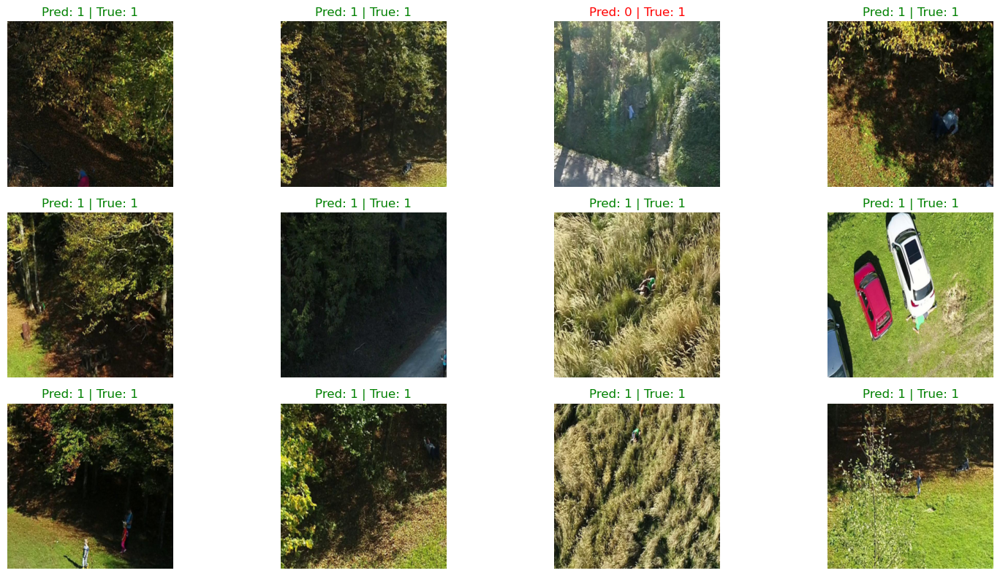

In [31]:
show_predictions_grid(model, test_loader, device, num_images=12)

# Result on External People Images

Extra folder 'pp' loaded: X shape = torch.Size([21, 3, 320, 320]), y shape = torch.Size([21])
All labels are set to 1 (has_person).

========== Evaluation on pp set ==========
Avg loss: 0.6086
Accuracy: 52.38% (11/21)

Predicted class counts:
  Pred 0 (no human): 10
  Pred 1 (human):    11

True label counts:
  True 0 (no human): 0
  True 1 (human):    21

Confusion matrix (rows=true, cols=pred):
          Pred 0    Pred 1
True 0 |      0        0
True 1 |     10       11


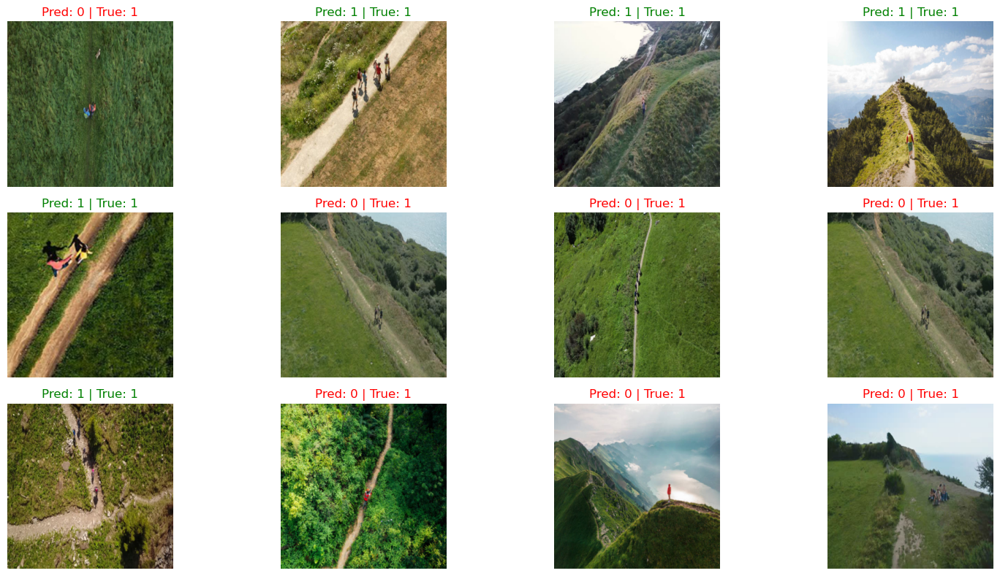

In [28]:
# Create a DataLoader for your extra 'pp' folder
pp_loader = load_folder_as_loader(
    folder_path="pp",          # folder containing your extra images
    transform=eval_transform,  # same eval transform as valid/test
    batch_size=BATCH_SIZE,
    label_value=1              # all images in pp have people
)

# Evaluate numerically on pp set (optional, but useful)
pp_results = evaluate_on_loader(model, pp_loader, device, loader_name="pp")

# Visual check: show some random predictions from pp
show_predictions_grid(model, pp_loader, device, num_images=12)

## Result on No people images 

Extra folder 'no_pp' loaded: X shape = torch.Size([24, 3, 320, 320]), y shape = torch.Size([24])
All labels are set to 0 (has_person).

========== Evaluation on pp set ==========
Avg loss: 2.2068
Accuracy: 45.83% (11/24)

Predicted class counts:
  Pred 0 (no human): 11
  Pred 1 (human):    13

True label counts:
  True 0 (no human): 24
  True 1 (human):    0

Confusion matrix (rows=true, cols=pred):
          Pred 0    Pred 1
True 0 |     11       13
True 1 |      0        0


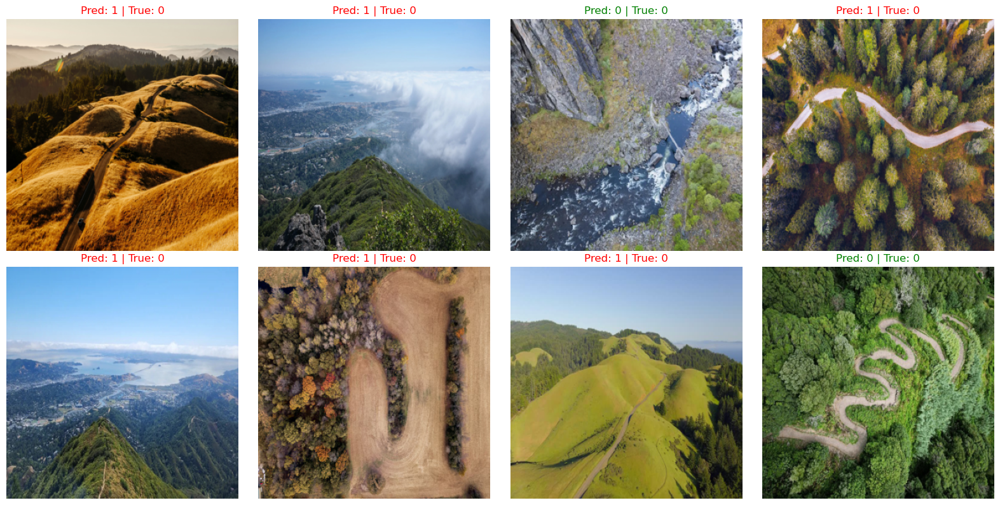

In [29]:
# Create a DataLoader for your extra 'pp' folder
no_pp_loader = load_folder_as_loader(
    folder_path="no_pp",          # folder containing your extra images
    transform=eval_transform,  # same eval transform as valid/test
    batch_size=BATCH_SIZE,
    label_value=0              # all images have no people
)

# Evaluate numerically on pp set (optional, but useful)
no_pp_results = evaluate_on_loader(model, no_pp_loader, device, loader_name="pp")

# Visual check: show some random predictions from pp
show_predictions_grid(model, no_pp_loader, device, num_images=8)


## Final Discussion

The goal of this project was to evaluate whether a lightweight CNN, trained from scratch, could reliably detect the presence or absence of humans in aerial drone images. Based on the visualizations, confusion matrices, and external evaluations presented in this notebook, we can now summarize how the model performs in practice.

### 1. Strengths of the Custom CNN

- The model successfully identifies humans in many aerial images, especially when:
  - The person occupies a noticeable portion of the frame  
  - The scene is well-lit  
  - The silhouette of the human is distinct  

- The model is lightweight and computationally inexpensive compared to large pretrained models.  
  This makes it more suitable for low-power hardware or edge devices.

These strengths demonstrate that a small CNN *can* learn meaningful features about aerial humans, even when trained from scratch on a limited dataset.

---

### 2. Key Limitations Observed

Despite its strengths, the CNN exhibits several significant limitations when applied to real-world drone imagery.

#### **a. Difficulty with Tiny or Distant Humans**
Human figures in drone footage are often extremely small (sometimes < 10 pixels tall).  
When resizing from 640×640 → 224×224, these figures almost disappear.  
Even at 320×320, the CNN struggles to detect tiny humans.

This leads to:
- Missed detections (false negatives)  
- Unreliable performance when altitude increases  

#### **b. High Rate of False Positives**
The CNN frequently predicts “human” in empty scenes.  
In the external no-person dataset:

- **13 out of 24** empty images were incorrectly labeled as containing a person.

Textures such as rocks, bushes, bright patches, or structure edges resemble small human-like blobs at a distance.  
The CNN lacks the spatial sensitivity to differentiate these fine details.

#### **c. Strong Sensitivity to Class Imbalance**
Because 85% of the training images contain humans, the model is naturally biased toward predicting “has_person.”  
This explains why:

- It performs well on the human class  
- But performs poorly on `no_person` scenes  
- And why precision/recall between classes is highly unbalanced  

#### **d. Limited Generalization to Real-World Images**
In the external "has person" dataset:

- Only **11 out of 21** real-world images were correctly classified.

Real-world aerial imagery varies in lighting, contrast, terrain, and human visibility, all of which the CNN struggles to generalize across.

#### **e. Whole-Image Classification is a Fundamental Limitation**
Our CNN produces one label per image.  
But the presence of a human might be visible in only a tiny portion of the image.

This approach lacks:
- Localization  
- Awareness of where the person is  
- The ability to focus on relevant regions  

This is a core reason detection-based models (YOLO, Faster R-CNN) outperform classifiers on aerial data.

---

### 3. Practical Implications

Given these limitations, the custom CNN in its current form is **not suitable for real-world search-and-rescue or autonomous drone applications**.

Misclassifying empty terrain as containing a person could lead to:
- Wasted time during rescue  
- Increased false alerts  
- Unreliable onboard decision-making  

Conversely, missing actual humans is even more critical and can create safety risks.

---

### 4. Area of Improvements of Deployment

To make the model operationally reliable, the following improvements are recommended:

- **Balance the dataset** or apply oversampling/undersampling strategies  
- **Calibrate confidence thresholds** to reduce false positives
- **Increase input resolution** or crop regions to preserve tiny details  
- **Use pretrained models (ResNet, MobileNet)** for stronger feature extraction  
- **Adopt object detection models (YOLO)** that predict bounding boxes  


---

### 5. Conclusion

The custom CNN serves as a valuable baseline model that demonstrates the challenges of whole-image classification in aerial human detection. While it shows promising performance on clear cases, visual analysis reveals major weaknesses in detecting tiny or partially visible humans and distinguishing clutter from people.